<a href="https://colab.research.google.com/github/merzechan/Predicting-Diseases-in-Chinese-Cabbage/blob/main/Capstone3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import os, datetime
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image, display
import re
import itertools
from collections import Counter
import math
#!pip install split-folders
#import splitfolders

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report, f1_score

from skimage.segmentation import mark_boundaries

import tensorflow as tf
import tensorflow_hub as hub
import tensorboard as tb
import tensorflow_datasets as tfds
from tensorflow.keras import layers, utils
from tensorflow.keras import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
!pip install tensorflow-addons
from tensorflow_addons.metrics import F1Score
from tensorflow.keras import backend as K

import cv2

!pip install lime
from lime import lime_image

RANDOM_STATE = np.random.RandomState(0)


from google.colab import drive
drive.mount("/content/gdrive")

     |████████████████████████████████| 1.1 MB 13.3 MB/s 
     |████████████████████████████████| 275 kB 10.0 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=2a060cbcd6ab26397350de629552b062f98f8002445a4d81011955de46b59e6c
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime
Mounted at /content/gdrive


In [2]:
healthy_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.2,
    shear_range=20,
    brightness_range=(0.4,0.6)
    )


In [3]:
def generate_image_data(input_path, output_path,class_name,n_batches):
  count=0
  for batch in healthy_datagen.flow_from_directory(
      input_path,
      classes=[class_name],
      target_size=(528,528),
      batch_size= 32,
      class_mode="categorical",
      save_to_dir=output_path,
      save_prefix=class_name
      ):
    count+=1
    if count == n_batches:
      break

In [4]:
# run only once; already ran
"""
generate_image_data('/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/',
                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/healthy",
                    "healthy",
                     100)
"""

'\ngenerate_image_data(\'/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/\',\n                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/healthy",\n                    "healthy",\n                     100)\n'

In [5]:
# run only once; already ran
"""
generate_image_data('/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/',
                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/healthy",
                    "healthy",
                     100)
"""

'\ngenerate_image_data(\'/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/\',\n                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/healthy",\n                    "healthy",\n                     100)\n'

In [6]:
# run only once; already ran
"""
generate_image_data('/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/',
                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/mildew",
                    "mildew",
                     26)
"""

'\ngenerate_image_data(\'/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/\',\n                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train/mildew",\n                    "mildew",\n                     26)\n'

In [7]:
# run only once; already ran
"""
generate_image_data('/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/',
                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/mildew",
                    "mildew",
                     7)
"""

'\ngenerate_image_data(\'/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/\',\n                    "/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/mildew",\n                    "mildew",\n                     7)\n'

In [8]:
TRAIN_PATH="/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/train"
VAL_PATH="/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val"

In [9]:
""" This is set of default values """

# Define image size
IMG_SIZE = 528

# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = 3

# Setup model URL from TensorFlow Hub
MobileNetV2 = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"
EfficientNetB0 = "https://tfhub.dev/tensorflow/efficientnet/b0/classification/1"
MobileNetV3 = "https://tfhub.dev/google/imagenet/mobilenet_v3_small_100_224/classification/5"
InceptionV3 = "https://tfhub.dev/google/imagenet/inception_v3/classification/5"
EfficientNetB5 = 'https://tfhub.dev/tensorflow/efficientnet/b5/classification/1' #img_size=456
EfficientNetB6 = 'https://tfhub.dev/tensorflow/efficientnet/b6/classification/1' #img_size=528

# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_f1_m',
                                                  patience=10, mode='max')

# Create model checkpoint callback
checkpoint_path = "/content/gdrive/My Drive/bok_choy/models/checkpoints/cp.ckpt"
checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,save_weights_only=True)

# Tensorboard Logs path
LOGS = "/content/gdrive/My Drive/bok_choy/logs"

# Setup TensorBoard
file_writer = tf.summary.create_file_writer(LOGS)

In [10]:
# Create training image generator
train_datagen = ImageDataGenerator(
  rescale=1./255,
  rotation_range=90,
  width_shift_range=0.05,
  height_shift_range=0.05,
  horizontal_flip=True,
  vertical_flip=True
  )

# Create train dataset
train_data = train_datagen.flow_from_directory(
  TRAIN_PATH ,
  target_size=(IMG_SIZE,IMG_SIZE),
  batch_size= BATCH_SIZE,
  class_mode="categorical",
  classes=['backmoth','healthy','mildew'],
  seed=123
  )

# Create validation image generator
val_datagen = ImageDataGenerator(
  rescale=1./255,
  )

# Create validation dataset
val_data = val_datagen.flow_from_directory(
  VAL_PATH,
  target_size=(IMG_SIZE,IMG_SIZE),
  batch_size= BATCH_SIZE,
  class_mode="categorical",
  classes=['backmoth','healthy','mildew'],
  seed=123
  )

Found 4285 images belonging to 3 classes.
Found 1078 images belonging to 3 classes.


In [11]:
counter = Counter(train_data.classes)
print(train_data.class_indices.keys(),"\n")

print(counter.items())

dict_keys(['backmoth', 'healthy', 'mildew']) 

dict_items([(0, 1433), (1, 1456), (2, 1396)])


In [12]:
x=[]
y=[]
for i in train_data.class_indices.keys():
  x.append(i)
for i,j in counter.items():
  y.append(j)
print(x)
print(y)

['backmoth', 'healthy', 'mildew']
[1433, 1456, 1396]


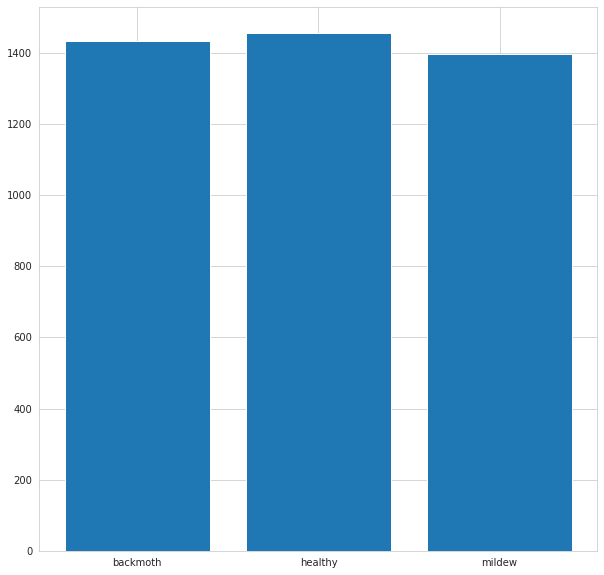

In [13]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,10))
plt.bar(x,y);

In [14]:
counter_val = Counter(val_data.classes)
x_val=[]
y_val=[]
for i in val_data.class_indices.keys():
  x_val.append(i)
for i,j in counter_val.items():
  y_val.append(j)
print(x_val)
print(y_val)

['backmoth', 'healthy', 'mildew']
[360, 354, 364]


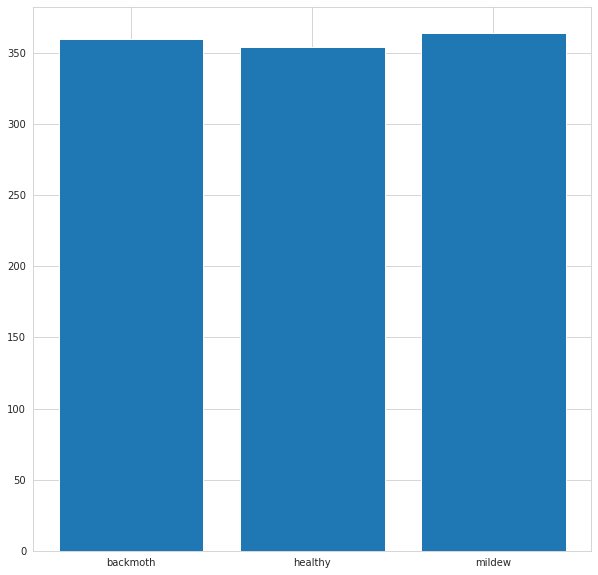

In [15]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,10))
plt.bar(x_val,y_val);

In [16]:
unique_disease=np.array(['backmoth','healthy','mildew'])
unique_disease

array(['backmoth', 'healthy', 'mildew'], dtype='<U8')

In [17]:
# Set number of images to use for experimenting
NUM_IMAGES = 5000 #@param {type:"slider", min:500, max:10000, step:500}

In [18]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:200, step:10}

In [19]:
# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image



# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label





# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

# Create a function for viewing images in a data batch
def show_15_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  fig, ax = plt.subplots(3,5,figsize=(20,10))
  ax = ax.ravel()
  # Loop through 25 (for displaying 25 images)
  for i in range(15):
    # Display an image 
    ax[i].imshow(images[i])
    # Add the image label as the title
    ax[i].title.set_text(unique_disease[labels[i].argmax()])
    # Turn the grid lines off
    ax[i].axis("off");
  fig.tight_layout()




# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=EfficientNetB6,image_size=IMG_SIZE):
  print("Building model with:", max(model_url.split('/')[4:]))

   # Setup the model layers
  model = Sequential([
    layers.Resizing(image_size,images_size),
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    layers.Dense(units=output_shape,
                 activation="softmax",
                 name = "output_layer") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['acc','AUC',recall_m,precision_m,f1_m]
  )

  # Build the model
  model.build(INPUT_SHAPE)
  print(model.summary())
  return model

# Create a function to build a TensorBoard callback
def create_tensorboard_callback(model_name):
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join(LOGS,
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")+model_name)
  return tf.keras.callbacks.TensorBoard(logdir)


# Build a function to train and return a trained model
def train_model(model,model_name,train_dataset=train_data,validation_dataset=val_data):
  
  # Trains a given model and returns the trained version.


  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback(model_name)

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_dataset,
            steps_per_epoch= len(train_data),
            epochs=NUM_EPOCHS,
            validation_data=validation_dataset,
            validation_steps= len(val_data),
            validation_freq=1,
            callbacks=[tensorboard,checkpoint])
  # Return the fitted model
  return model



def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_disease[np.argmax(prediction_probabilities)]


def unbatchify(data,str_labels=True):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  lab=[]
  # Loop through unbatched data
  for i in range(data.__len__() ):
    images.extend(
      data.__getitem__( i )[0] 
      )
    labels.extend(
      data.__getitem__( i )[1] 
      )
  if str_labels:
    for i in labels:
      lab.append(unique_disease[np.argmax(i)])
  else:
    for i in labels:
      lab.append(np.argmax(i))
  lab = np.array(lab)

  return images, lab


def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_disease[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/gdrive/My Drive/bok_choy/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer,
                                                     "recall_m":recall_m,
                                                     "precision_m":precision_m,
                                                     "f1_m":f1_m  
                                                    }
                                     )
  return model

def load_checkpoint(model,cpath=checkpoint_path,validation_data=val_data):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved checkpoints from: {checkpoint_path}")
  model = model.load_weights(checkpoint_path)

  #Show last checkpoint results
  result = model.evaluate(validation_data)
  results = dict(zip(model.metrics_names, result))
  print(results)
  return model


def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  sns.set_style('white')
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap='GnBu') # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Added: Rotate xticks for readability & increase font size (required due to such a large confusion matrix)
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")
  
  class_rep = classification_report(y_true, y_pred)
  print(class_rep)

# Batch Predict
def batch_predict(preds,validation=val_data, num_rows=5, num_cols=2,i_multiplier=25):
  # Make predictions on the validation data (not used to train on)
  val_images, val_labels = unbatchify(validation)
  
  # Subplot predictions
  num_images = num_rows*num_cols
  plt.figure(figsize=(10*num_cols, 5*num_rows))
  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=preds,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=preds,
                  labels=val_labels,
                  n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt.show()



# LIME Explainer
def LIME_explanation(model,img,n_samples=1000):
  explainer = lime_image.LimeImageExplainer()
  explanation = explainer.explain_instance(img.numpy().astype('double'), model.predict,  
                                         top_labels=3, hide_color=0, num_samples=n_samples)

  temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
  temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
  ax1.imshow(mark_boundaries(temp_1, mask_1))
  ax2.imshow(mark_boundaries(temp_2, mask_2))
  ax1.axis('off')
  ax2.axis('off')


# Create custom metrics
### Define F1 measures: F1 = 2 * (precision * recall) / (precision + recall)
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

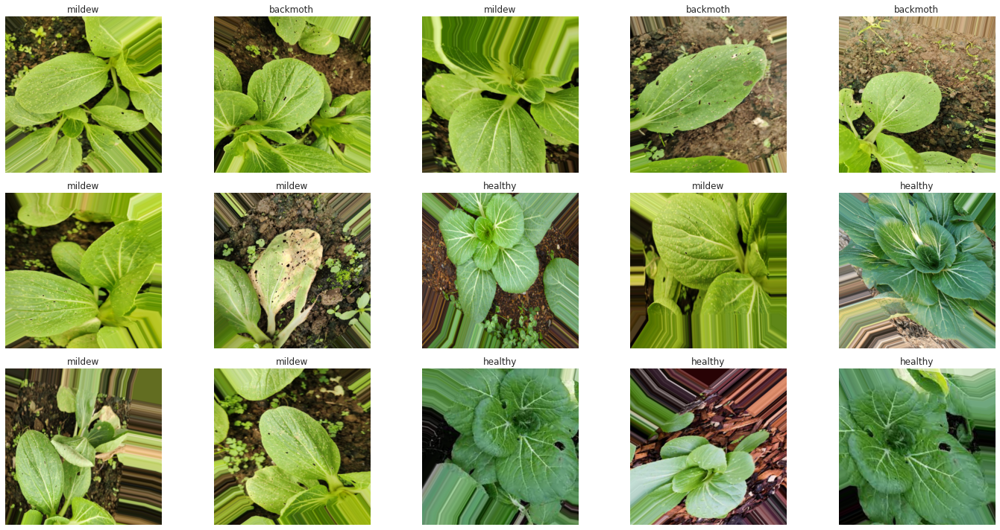

In [20]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data)
show_15_images(train_images, train_labels)

In [21]:
# Load TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir /content/gdrive/My\ Drive/bok_choy/logs

<IPython.core.display.Javascript object>

In [28]:
len(val_labels)

1078

In [ ]:
len(val_images)

1078

In [ ]:
# Fit EfficientNetB6 model
model_b6_f1 = train_model(create_model(model_url=EfficientNetB6,image_size=528),"EfficientNetB6_nonstop2")

Building model with: efficientnet
Epoch 1/200
134/134 [==============================] - 3162s 23s/step - loss: 1.0830 - acc: 0.4656 - auc: 0.6802 - recall_m: 0.0000e+00 - precision_m: 0.0000e+00 - f1_m: 0.0000e+00 - val_loss: 1.0940 - val_acc: 0.3330 - val_auc: 0.5578 - val_recall_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_f1_m: 0.0000e+00
Epoch 2/200
134/134 [==============================] - 356s 3s/step - loss: 1.0576 - acc: 0.5246 - auc: 0.7368 - recall_m: 0.0000e+00 - precision_m: 0.0000e+00 - f1_m: 0.0000e+00 - val_loss: 1.0877 - val_acc: 0.3312 - val_auc: 0.5744 - val_recall_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_f1_m: 0.0000e+00
Epoch 3/200
134/134 [==============================] - 352s 3s/step - loss: 1.0334 - acc: 0.5377 - auc: 0.7466 - recall_m: 0.0000e+00 - precision_m: 0.0000e+00 - f1_m: 0.0000e+00 - val_loss: 1.0832 - val_acc: 0.3358 - val_auc: 0.5809 - val_recall_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_f1_m: 0.0000e+00
Epoch 4/200
134/134 [=

In [20]:
model = create_model()


Building model with: efficientnet
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 528, 528, 3)       0         
                                                                 
 keras_layer (KerasLayer)    (None, 1000)              43265136  
                                                                 
 output_layer (Dense)        (None, 3)                 3003      
                                                                 
Total params: 43,268,139
Trainable params: 3,003
Non-trainable params: 43,265,136
_________________________________________________________________
None


In [21]:
load_checkpoint(model)

Loading saved checkpoints from: /content/gdrive/My Drive/bok_choy/models/checkpoints/cp.ckpt


In [22]:
train_model(model,"EfficientNetB6_nonstop2")

Epoch 1/100
134/134 [==============================] - 2335s 17s/step - loss: 0.5736 - acc: 0.7718 - auc: 0.9305 - recall_m: 0.6635 - precision_m: 0.8533 - f1_m: 0.7450 - val_loss: 0.9260 - val_acc: 0.5594 - val_auc: 0.7547 - val_recall_m: 0.4128 - val_precision_m: 0.6666 - val_f1_m: 0.5072
Epoch 2/100
134/134 [==============================] - 340s 3s/step - loss: 0.5721 - acc: 0.7753 - auc: 0.9311 - recall_m: 0.6740 - precision_m: 0.8561 - f1_m: 0.7529 - val_loss: 0.9266 - val_acc: 0.5575 - val_auc: 0.7543 - val_recall_m: 0.4105 - val_precision_m: 0.6506 - val_f1_m: 0.5020
Epoch 3/100
134/134 [==============================] - 337s 3s/step - loss: 0.5731 - acc: 0.7687 - auc: 0.9287 - recall_m: 0.6567 - precision_m: 0.8443 - f1_m: 0.7368 - val_loss: 0.9272 - val_acc: 0.5594 - val_auc: 0.7541 - val_recall_m: 0.4100 - val_precision_m: 0.6492 - val_f1_m: 0.5003
Epoch 4/100
134/134 [==============================] - 338s 3s/step - loss: 0.5692 - acc: 0.7711 - auc: 0.9310 - recall_m: 0.664

In [ ]:
save_model(model_b6_f1, suffix="EfficientNetB6_nonstop2")

In [ ]:
model = load_model("/content/gdrive/My Drive/bok_choy/models/20211214-20281639513699-EfficientNetB6_nonstop.h5")

Loading saved model from: /content/gdrive/My Drive/bok_choy/models/20211214-20281639513699-EfficientNetB6_nonstop.h5


In [27]:
exclude = set(['leafminer'])
filenames=[]
labels=[]

for root, dirs, files in os.walk(VAL_PATH, topdown=True):
  [dirs.remove(d) for d in list(dirs) if d in exclude]
  for name in files:
      filenames.append(os.path.join(root, name))
      labels.append(name)
labels = [re.split(r'(_?\d+)', s)[0].lower() for s in labels]

In [28]:
print(filenames[::40])
print(labels[::40])

['/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1437.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1495.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1553.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1540.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1588.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1673.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1631.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1637.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/backmoth/Backmoth1767.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/healthy/healthy17.jpg', '/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/healthy/healthy_0_5

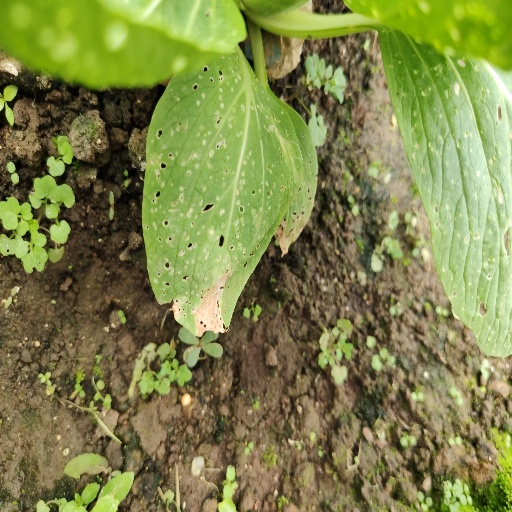

/content/gdrive/MyDrive/bok_choy/manual_split/manual_split/val/mildew/Mildew669.jpg


In [29]:
display(Image(filenames[823]))
print(filenames[823])

In [30]:
# Create validation images and labels for confusion matrix
val_images, val_labels = unbatchify(val_data,str_labels=False)

In [31]:
# Sampling an image to feed for LIME explainer
sample_img, sample_label = get_image_label(filenames[823], labels[823])

In [23]:
result = model.evaluate(val_data)
results = dict(zip(model.metrics_names, result))
print(results)

34/34 [==============================] - 30s 874ms/step - loss: 0.9062 - acc: 0.5798 - auc: 0.7771 - recall_m: 0.4440 - precision_m: 0.6897 - f1_m: 0.5379
{'loss': 0.9061661958694458, 'acc': 0.5797773599624634, 'auc': 0.7771489024162292, 'recall_m': 0.4440173804759979, 'precision_m': 0.6897030472755432, 'f1_m': 0.5378836393356323}


In [24]:
preds = model.predict(val_data)

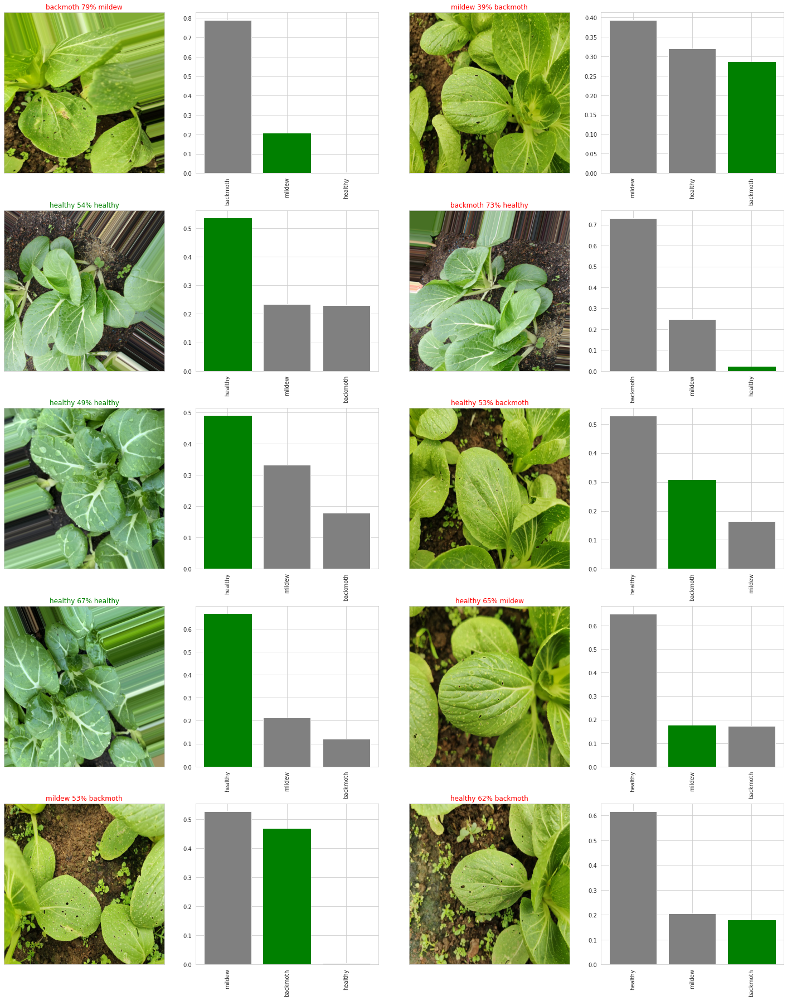

In [25]:
batch_predict(preds)

  0%|          | 0/1000 [00:00<?, ?it/s]

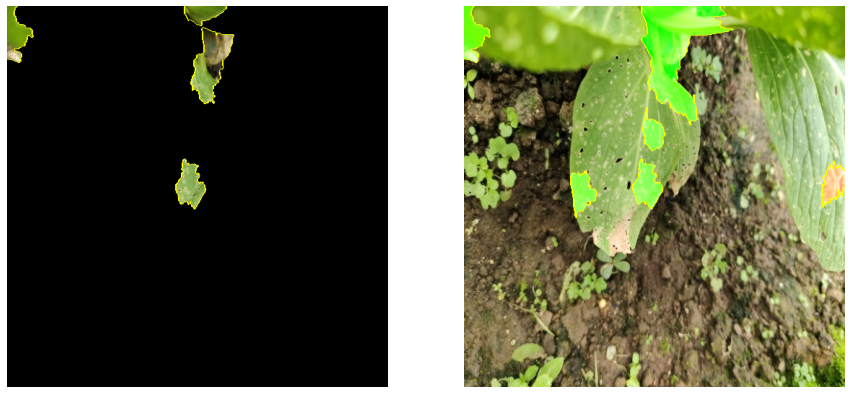

In [32]:
LIME_explanation(model,sample_img)

              precision    recall  f1-score   support

           0       0.37      0.47      0.41       360
           1       0.35      0.45      0.39       354
           2       0.29      0.12      0.17       364

    accuracy                           0.35      1078
   macro avg       0.33      0.35      0.33      1078
weighted avg       0.33      0.35      0.32      1078



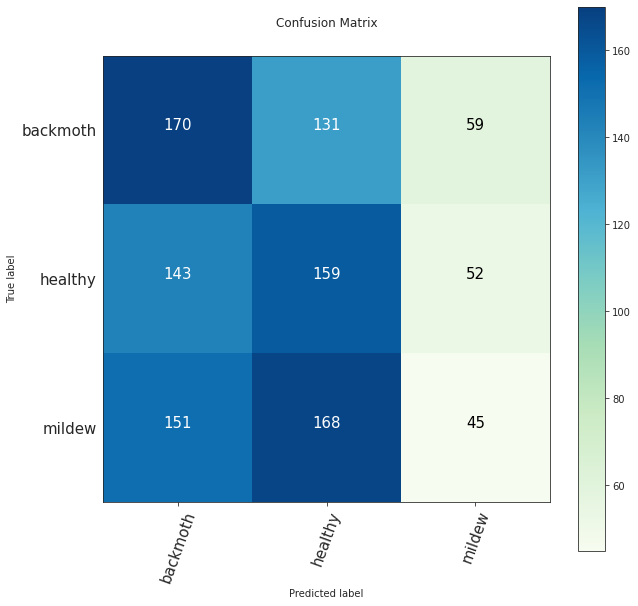

In [33]:
make_confusion_matrix(val_labels, preds.argmax(axis=1), classes=['backmoth','healthy','mildew'], figsize=(10, 10), text_size=15, norm=False, savefig=False)